# sgis
https://github.com/statisticsnorway/ssb-sgis

Åpne heller notebooken her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/ssb_sgis.ipynb

In [1]:
# midlrertidig pga noen lokale endringer i pakka
import os
while "ssb-sgis" not in os.listdir():
    os.chdir("..")
os.chdir("ssb-sgis/src")
os.listdir()

['sgis']

In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import sgis as sg

For å installere:

poetry add ssb-sgis

Eller:

pip install ssb-sgis

## Pakken inneholder:
- Funksjoner for bedre kartlegging (se egen notebook 'kartlegging')
- Nettverksanalyse (se egen notebook 'nettverksanalyse')
- GIS-funksjoner som mangler i geopandas

Henter først bygningspunkter.

In [3]:
aar = 2022

bygningspunktsti = f"ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/{aar}/SMAT_bygg_punkt_p{aar}_v1.parquet"

bygg = sg.read_geopandas(
    bygningspunktsti,
    filters=[("KOMMUNENR", "=", '0301')],
    columns=["KOMMUNENR", "BYGTYPE", "AREAL_E2", "DATOMERGE", "geometry"]
)

bygg["aar"] = bygg.DATOMERGE.map(lambda x: int(x[:4].replace(" ", "0")))

bygg = bygg.sample(5000)

bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar
2385918,0301,111,97.0,19590901,POINT (264186.000 6644799.000),1959
2584381,0301,181,33.0,19931123,POINT (270157.000 6654182.000),1993
2641906,0301,181,33.0,19010101,POINT (256757.000 6655880.000),1901
2434011,0301,111,72.0,19891201,POINT (266108.000 6648100.000),1989
2560686,0301,121,86.0,20190411,POINT (258366.000 6653725.000),2019
...,...,...,...,...,...,...
2539194,0301,121,86.0,19500311,POINT (270524.000 6652501.000),1950
2563295,0301,223,7.0,19721001,POINT (259885.000 6653617.000),1972
2404927,0301,181,48.0,20110610,POINT (265278.000 6644718.000),2011
2492016,0301,181,34.0,20040102,POINT (267612.000 6649890.000),2004


## GIS-funksjoner (som mangler i geopandas)

### Finn k nærmeste naboer

In [4]:
naboer100 = sg.get_k_nearest_neighbors(
    bygg, bygg, k=100,
)

naboer100

,neighbor_index,distance
2385918,2385918,0.000000
2385918,2385481,76.367532
2385918,2406854,81.344945
2385918,2386366,84.646323
2385918,2406818,138.974818
...,...,...
2410260,2359390,1431.157573
2410260,2360048,1431.431451
2410260,2384398,1431.665114
2410260,2384397,1436.575442


Resultatene respekterer index-en, og kan derfor kobles med input nr 1 sånn:

In [5]:
joinet = bygg.join(naboer100)
joinet

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,neighbor_index,distance
2296263,0301,181,33.0,19890901,POINT (266994.000 6638440.000),1989,2296263,0.000000
2296263,0301,181,33.0,19890901,POINT (266994.000 6638440.000),1989,2301163,79.202273
2296263,0301,181,33.0,19890901,POINT (266994.000 6638440.000),1989,2349450,131.137333
2296263,0301,181,33.0,19890901,POINT (266994.000 6638440.000),1989,2302623,179.477018
2296263,0301,181,33.0,19890901,POINT (266994.000 6638440.000),1989,2347553,195.166596
...,...,...,...,...,...,...,...,...
2695271,0301,161,59.0,19010101,POINT (259268.000 6671489.000),1901,2612745,14509.716641
2695271,0301,161,59.0,19010101,POINT (259268.000 6671489.000),1901,2633884,14587.662253
2695271,0301,161,59.0,19010101,POINT (259268.000 6671489.000),1901,2631464,14631.021871
2695271,0301,161,59.0,19010101,POINT (259268.000 6671489.000),1901,2614642,14656.759601


In [6]:
snittavstand_per_bygg = (
    naboer100.loc[naboer100.distance != 0]
    .groupby(level=0)
    .distance.mean()
)

snittavstand_per_bygg

2296263      869.273734
2296274      830.984668
2296740      877.592960
2296802      774.619665
2297013     2311.340832
               ...     
2678041    10749.418292
2680987    10774.232811
2684480    13305.365761
2695197    11228.375648
2695271    11487.707016
Name: distance, Length: 5000, dtype: float64

In [7]:
bygg["snittavstand_99_naboer"] = snittavstand_per_bygg
bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,snittavstand_99_naboer
2385918,0301,111,97.0,19590901,POINT (264186.000 6644799.000),1959,503.789607
2584381,0301,181,33.0,19931123,POINT (270157.000 6654182.000),1993,656.364684
2641906,0301,181,33.0,19010101,POINT (256757.000 6655880.000),1901,833.327635
2434011,0301,111,72.0,19891201,POINT (266108.000 6648100.000),1989,549.273333
2560686,0301,121,86.0,20190411,POINT (258366.000 6653725.000),2019,472.569177
...,...,...,...,...,...,...,...
2539194,0301,121,86.0,19500311,POINT (270524.000 6652501.000),1950,860.328990
2563295,0301,223,7.0,19721001,POINT (259885.000 6653617.000),1972,539.677052
2404927,0301,181,48.0,20110610,POINT (265278.000 6644718.000),2011,491.062332
2492016,0301,181,34.0,20040102,POINT (267612.000 6649890.000),2004,875.773200


In [8]:
sg.explore(bygg, "snittavstand_99_naboer", scheme="quantiles")

### Feature to line
Gjør én eller flere GeoDataFrames til linjer.

In [9]:
import sgis as sg
from shapely.geometry import Polygon
poly1 = sg.to_gdf(Polygon([(0, 0), (0, 1), (1, 1), (1, 0)]))
poly1["poly1"] = 1
poly1

,geometry,poly1
0,"POLYGON ((0.00000 0.00000, 0.00000 1.00000, 1....",1


In [10]:
line = sg.to_lines(poly1)
line

,geometry,poly1
0,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ...",1


,poly1,poly2,geometry
0,1.0,NaN,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ..."
1,1.0,NaN,"LINESTRING (0.50000 1.00000, 1.00000 1.00000, ..."
2,1.0,NaN,"LINESTRING (1.00000 0.50000, 1.00000 0.00000, ..."
3,NaN,1.0,"LINESTRING (0.50000 0.50000, 0.50000 1.00000)"
4,NaN,1.0,"LINESTRING (0.50000 1.00000, 0.50000 1.50000, ..."
5,NaN,1.0,"LINESTRING (1.00000 0.50000, 0.50000 0.50000)"


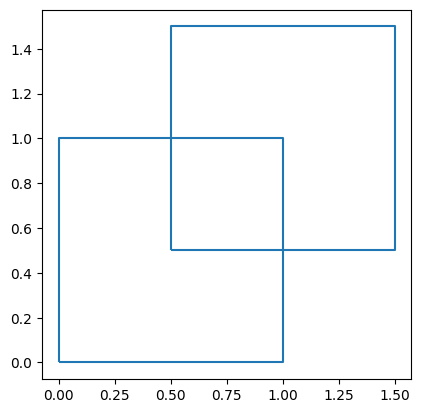

In [11]:
poly2 = sg.to_gdf(Polygon([(0.5, 0.5), (0.5, 1.5), (1.5, 1.5), (1.5, 0.5)]))
poly2["poly2"] = 1

lines = sg.to_lines(poly1, poly2)

lines

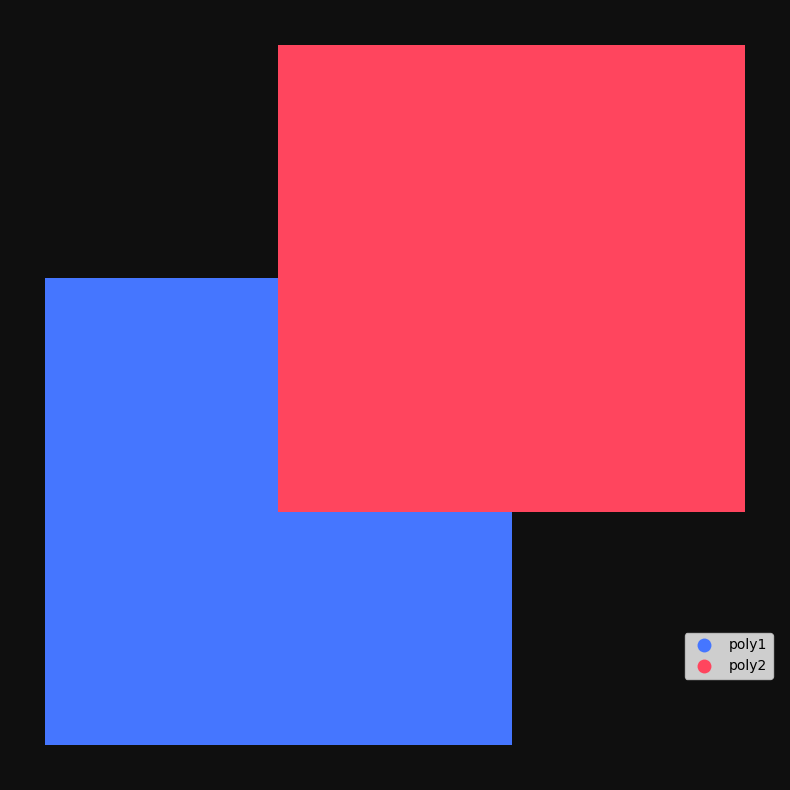

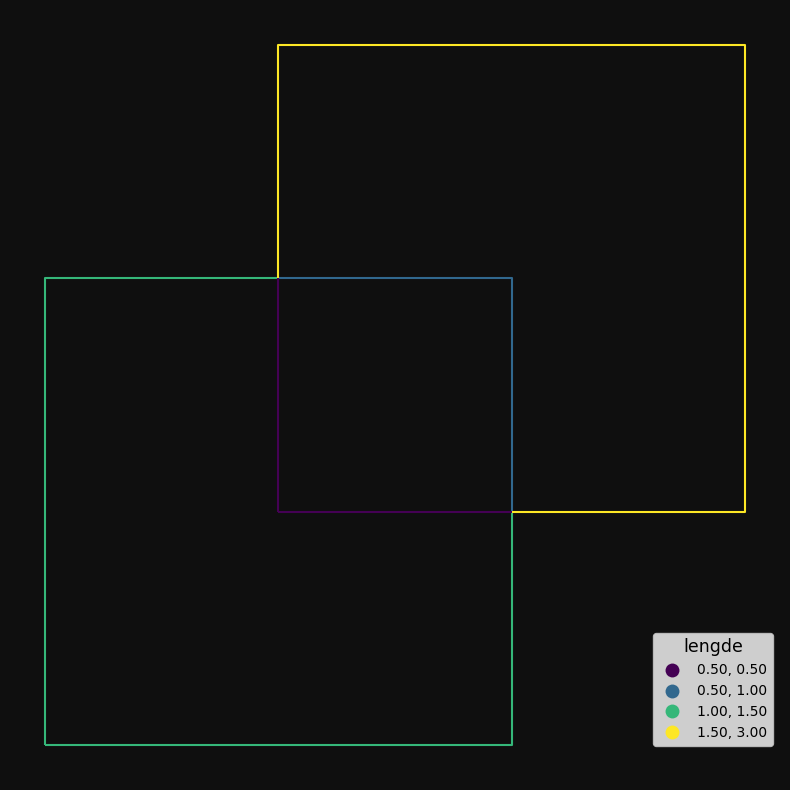

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [12]:
sg.qtm(poly1, poly2)
lines["lengde"] = lines.length
sg.qtm(lines, "lengde")

### Tette hull i polygoner
Lager et polygon med to hull.

In [13]:
kommunesti = "ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/2022/ABAS_kommune_flate_p2022_v1.parquet"

kommuner = sg.read_geopandas(kommunesti)

kommuner

,OBJTYPE,NAVN,KOMMUNENR,FYLKE,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,Kommune,Oslo,0301,03,4.810366e+08,118497.084607,4.810366e+08,"MULTIPOLYGON (((253222.080 6658210.130, 253213..."
1,Kommune,Eigersund,1101,11,1.068053e+09,189082.161550,1.068053e+09,"MULTIPOLYGON (((-32368.950 6519591.960, -32344..."
2,Kommune,Stavanger,1103,11,7.808179e+08,162361.635846,7.808179e+08,"MULTIPOLYGON (((-42633.160 6593087.740, -42516..."
3,Kommune,Haugesund,1106,11,3.681692e+08,119138.132103,3.681692e+08,"MULTIPOLYGON (((-69037.300 6632413.420, -70693..."
4,Kommune,Sandnes,1108,11,1.146669e+09,237674.681416,1.146669e+09,"MULTIPOLYGON (((-1895.270 6572773.840, -2588.4..."
...,...,...,...,...,...,...,...,...
351,Kommune,Berlevåg,5440,54,2.453869e+09,201335.692534,2.453869e+09,"MULTIPOLYGON (((998634.270 7930000.890, 999355..."
352,Kommune,Deatnu,5441,54,4.386665e+09,447896.358686,4.386665e+09,"MULTIPOLYGON (((961748.280 7852517.620, 961742..."
353,Kommune,Unjárga,5442,54,1.646886e+09,189375.998494,1.646886e+09,"MULTIPOLYGON (((1000896.830 7843608.070, 10013..."
354,Kommune,Båtsfjord,5443,54,2.834512e+09,219421.063877,2.834512e+09,"MULTIPOLYGON (((1033119.220 7899727.540, 10331..."


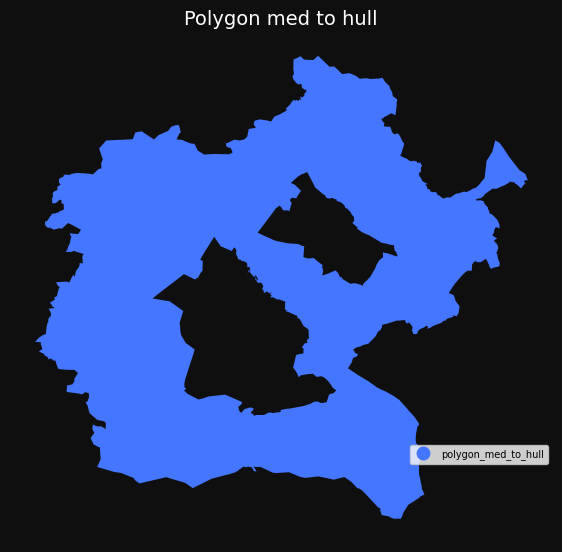

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Polygon med to hull'}>)

In [14]:
hol = kommuner.loc[kommuner.KOMMUNENR == "3044"]
hols_naboer = kommuner.loc[kommuner.touches(hol.unary_union)]

hemsedal = kommuner.loc[kommuner.KOMMUNENR == "3042"]
hemsedals_naboer = kommuner.loc[kommuner.touches(hemsedal.unary_union)]

polygon_med_to_hull = pd.concat([hols_naboer, hemsedals_naboer]).pipe(sg.dissexp)

sg.qtm(polygon_med_to_hull, title="Polygon med to hull", size=7)

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Alle hull tettet'}>)

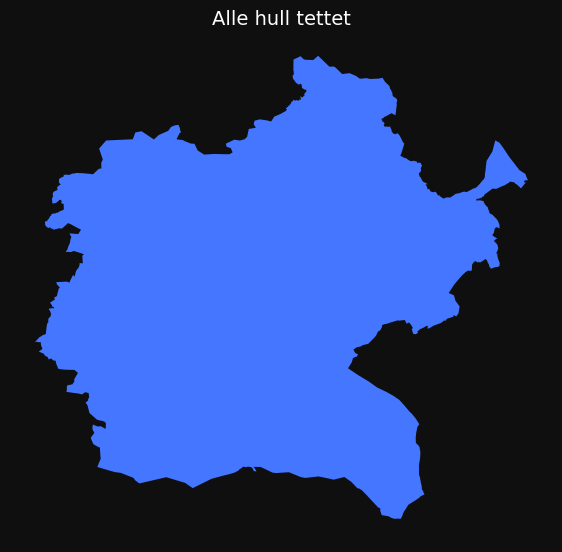

In [15]:
alle_hull_tettet = sg.close_all_holes(polygon_med_to_hull)

sg.qtm(alle_hull_tettet, title="Alle hull tettet", size=7, legend=False)

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Hull under 1000 km2 tettet'}>)

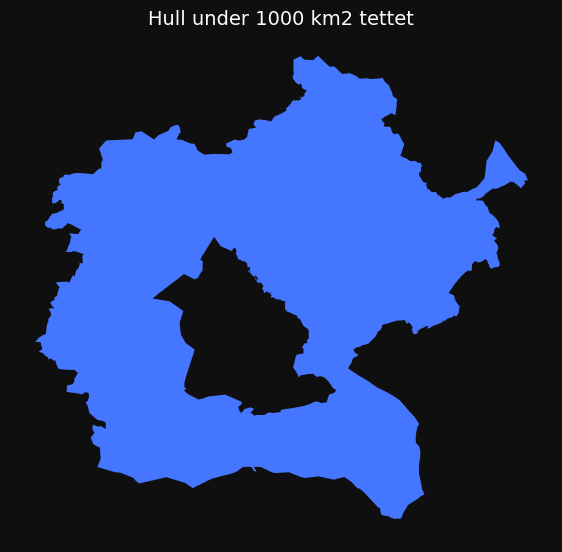

In [16]:
smaa_hull_tettet = sg.close_small_holes(polygon_med_to_hull, max_area=1000 * 1_000_000)

sg.qtm(smaa_hull_tettet, title="Hull under 1000 km2 tettet", size=7, legend=False)

### Repair geometry

Det vil si, hvis man vil reparere, fjerne tomme og manglende geometrier og beholde bare én geometritype (multi- og singlepart). 

Ler en invalid geometri:

is_valid = False


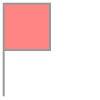

In [17]:
from shapely.geometry import Polygon
invalid_geometry = Polygon([(0,1), (0,0), (0,1),(1,1),(1,2),(0,2),(0,0)])
print("is_valid =", invalid_geometry.is_valid)
invalid_geometry

Gjør det til GeoDataFrame og legger til en tom geometri og en None-geometri.

In [18]:
invalid_geometry = sg.to_gdf(invalid_geometry)

empty_geometry = sg.to_gdf("POINT (0 0)").pipe(sg.buff, 0)

missing_geometry = gpd.GeoDataFrame(
    {"geometry": [None]}, geometry="geometry", crs=25833
)

gdf = pd.concat([invalid_geometry, missing_geometry, empty_geometry])

gdf["valid"] = gdf.is_valid

gdf

/home/jovyan/arealrek/.venv/lib/python3.10/site-packages/geopandas/array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as ETRS89 / UTM zone 33N (the single non-null crs provided).
  warnings.warn(


,geometry,valid
0,"POLYGON ((0.000 1.000, 0.000 0.000, 0.000 1.00...",False
0,None,False
0,POLYGON EMPTY,True


Reparering med geopandas:

In [19]:
gdf.make_valid()

0    GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...
0                                                 None
0                                        POLYGON EMPTY
dtype: geometry

For å fjerne tomme og manglende:

In [20]:
gdf = sg.clean_geoms(gdf)
gdf

,geometry,valid
0,"GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...",False


Man får likevel en geometritype som er håpløs å jobbe med (geometrycollection).

Og for å få riktig geometritype:

In [21]:
gdf = sg.to_single_geom_type(gdf, "polygon")
gdf

,geometry,valid
0,"POLYGON ((0.000 2.000, 1.000 2.000, 1.000 1.00...",False


### Snap punkter

In [22]:
snap_til = sg.buff(bygg.iloc[[0]], 500)

sg.explore(snap_til, bygg)

In [23]:
snappede_bygg = sg.snap_all(bygg, snap_til)

snappede_bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,snittavstand_99_naboer
2385918,0301,111,97.0,19590901,POINT (264447.217 6644372.733),1959,503.789607
2584381,0301,181,33.0,19931123,POINT (264453.913 6645221.164),1993,656.364684
2641906,0301,181,33.0,19010101,POINT (263904.958 6645212.540),1901,833.327635
2434011,0301,111,72.0,19891201,POINT (264440.521 6645229.371),1989,549.273333
2560686,0301,121,86.0,20190411,POINT (263918.087 6645221.164),2019,472.569177
...,...,...,...,...,...,...,...
2539194,0301,121,86.0,19500311,POINT (264504.712 6645184.257),1950,860.328990
2563295,0301,223,7.0,19721001,POINT (263973.110 6645251.414),1972,539.677052
2404927,0301,181,48.0,20110610,POINT (264684.784 6644764.687),2011,491.062332
2492016,0301,181,34.0,20040102,POINT (264467.042 6645212.540),2004,875.773200


In [24]:
sg.explore(snap_til, snappede_bygg)

In [25]:
snappede_bygg = sg.snap_within_distance(bygg, snap_til, max_dist=5000)
snappede_bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,snittavstand_99_naboer
2385918,0301,111,97.0,19590901,POINT (264447.217 6644372.733),1959,503.789607
2584381,0301,181,33.0,19931123,POINT (270157.000 6654182.000),1993,656.364684
2641906,0301,181,33.0,19010101,POINT (256757.000 6655880.000),1901,833.327635
2434011,0301,111,72.0,19891201,POINT (264440.521 6645229.371),1989,549.273333
2560686,0301,121,86.0,20190411,POINT (258366.000 6653725.000),2019,472.569177
...,...,...,...,...,...,...,...
2539194,0301,121,86.0,19500311,POINT (270524.000 6652501.000),1950,860.328990
2563295,0301,223,7.0,19721001,POINT (259885.000 6653617.000),1972,539.677052
2404927,0301,181,48.0,20110610,POINT (264684.784 6644764.687),2011,491.062332
2492016,0301,181,34.0,20040102,POINT (267612.000 6649890.000),2004,875.773200


In [26]:
sg.explore(snap_til, snappede_bygg)

### Forenkling av geopandas-kode

Hvis man vil bufre uten å overskrive originaldata, og slå sammen overlappende polygoner basert på flere kolonner:

In [27]:
# buffer
kopi = kommuner.copy()
kopi["geometry"] = kopi.buffer(100, resolution=50)
kopi["geometry"] = kopi["geometry"].make_valid()

# dissolve
dissolvet = kopi.dissolve(by=["KOMMUNENR", "FYLKE"], as_index=False)
dissolvet["geometry"] = dissolvet["geometry"].make_valid()

#explode
singlepart = dissolvet.explode(index_parts=False)

singlepart

,KOMMUNENR,FYLKE,OBJTYPE,NAVN,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,0301,03,Kommune,Oslo,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
1,1101,11,Kommune,Eigersund,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,1103,11,Kommune,Stavanger,7.808179e+08,162361.635846,7.808179e+08,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,1106,11,Kommune,Haugesund,3.681692e+08,119138.132103,3.681692e+08,"POLYGON ((-69092.773 6632329.439, -70738.775 6..."
4,1108,11,Kommune,Sandnes,1.146669e+09,237674.681416,1.146669e+09,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...,...,...,...,...,...
351,5440,54,Kommune,Berlevåg,2.453869e+09,201335.692534,2.453869e+09,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
352,5441,54,Kommune,Deatnu,4.386665e+09,447896.358686,4.386665e+09,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
353,5442,54,Kommune,Unjárga,1.646886e+09,189375.998494,1.646886e+09,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
354,5443,54,Kommune,Båtsfjord,2.834512e+09,219421.063877,2.834512e+09,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


Eller:

In [28]:
singlepart2 = sg.buffdissexp(kommuner, 100, by=["KOMMUNENR", "FYLKE"], as_index=False)
singlepart2

,KOMMUNENR,FYLKE,OBJTYPE,NAVN,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,0301,03,Kommune,Oslo,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
1,1101,11,Kommune,Eigersund,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,1103,11,Kommune,Stavanger,7.808179e+08,162361.635846,7.808179e+08,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,1106,11,Kommune,Haugesund,3.681692e+08,119138.132103,3.681692e+08,"POLYGON ((-69092.773 6632329.439, -70738.775 6..."
4,1108,11,Kommune,Sandnes,1.146669e+09,237674.681416,1.146669e+09,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...,...,...,...,...,...
351,5440,54,Kommune,Berlevåg,2.453869e+09,201335.692534,2.453869e+09,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
352,5441,54,Kommune,Deatnu,4.386665e+09,447896.358686,4.386665e+09,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
353,5442,54,Kommune,Unjárga,1.646886e+09,189375.998494,1.646886e+09,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
354,5443,54,Kommune,Båtsfjord,2.834512e+09,219421.063877,2.834512e+09,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


In [29]:
singlepart.equals(singlepart2)

True

In [30]:
sg.buff(kommuner, 100)

,OBJTYPE,NAVN,KOMMUNENR,FYLKE,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,Kommune,Oslo,0301,03,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
1,Kommune,Eigersund,1101,11,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,Kommune,Stavanger,1103,11,7.808179e+08,162361.635846,7.808179e+08,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,Kommune,Haugesund,1106,11,3.681692e+08,119138.132103,3.681692e+08,"POLYGON ((-69092.773 6632329.439, -70738.775 6..."
4,Kommune,Sandnes,1108,11,1.146669e+09,237674.681416,1.146669e+09,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...,...,...,...,...,...
351,Kommune,Berlevåg,5440,54,2.453869e+09,201335.692534,2.453869e+09,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
352,Kommune,Deatnu,5441,54,4.386665e+09,447896.358686,4.386665e+09,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
353,Kommune,Unjárga,5442,54,1.646886e+09,189375.998494,1.646886e+09,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
354,Kommune,Båtsfjord,5443,54,2.834512e+09,219421.063877,2.834512e+09,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


In [31]:
sg.dissexp(kommuner, by="FYLKE")

,OBJTYPE,NAVN,KOMMUNENR,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
FYLKE,,,,,,,
03,Kommune,Oslo,0301,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((253222.080 6658210.130, 253213.550 6..."
11,Kommune,Eigersund,1101,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-56493.690 6508636.440, -59095.100 6..."
15,Kommune,Kristiansund,1505,6.712581e+08,144771.170588,6.712581e+08,"POLYGON ((104161.500 6907210.720, 104544.500 6..."
18,Kommune,Bodø,1804,4.823084e+09,382980.996878,4.823084e+09,"POLYGON ((355520.870 7222532.780, 355519.380 7..."
30,Kommune,Halden,3001,6.615597e+08,149961.340183,6.615597e+08,"POLYGON ((185190.670 6626164.670, 184993.840 6..."
34,Kommune,Kongsvinger,3401,1.036228e+09,201850.422546,1.036228e+09,"POLYGON ((190043.010 6740694.680, 190037.890 6..."
38,Kommune,Bamble,3813,3.714014e+08,87424.047590,3.714014e+08,"POLYGON ((187026.350 6607473.790, 187031.200 6..."
42,Kommune,Risør,4201,5.858170e+08,126090.649046,5.858170e+08,"POLYGON ((74935.480 6428254.040, 74211.540 642..."
46,Kommune,Bergen,4601,5.736759e+08,130775.266420,5.736759e+08,"POLYGON ((-32673.700 6646701.810, -32756.210 6..."


In [33]:
sg.buffdiss(kommuner, 100, by="FYLKE")

,geometry,OBJTYPE,NAVN,KOMMUNENR,AREAL_GDB,SHAPE_Length,SHAPE_Area
FYLKE,,,,,,,
03,"POLYGON ((249030.760 6661171.238, 249016.460 6...",Kommune,Oslo,0301,4.810366e+08,118497.084607,4.810366e+08
11,"POLYGON ((-54116.885 6504826.326, -56577.335 6...",Kommune,Eigersund,1101,1.068053e+09,189082.161550,1.068053e+09
15,"POLYGON ((104306.314 6907216.910, 104610.337 6...",Kommune,Kristiansund,1505,6.712581e+08,144771.170588,6.712581e+08
18,"POLYGON ((355416.931 7222351.162, 355420.131 7...",Kommune,Bodø,1804,4.823084e+09,382980.996878,4.823084e+09
30,"POLYGON ((181882.512 6634686.894, 181836.711 6...",Kommune,Halden,3001,6.615597e+08,149961.340183,6.615597e+08
34,"POLYGON ((189908.458 6740638.635, 189906.525 6...",Kommune,Kongsvinger,3401,1.036228e+09,201850.422546,1.036228e+09
38,"POLYGON ((163565.412 6541879.361, 163562.863 6...",Kommune,Bamble,3813,3.714014e+08,87424.047590,3.714014e+08
42,"POLYGON ((77278.528 6428849.472, 74964.098 642...",Kommune,Risør,4201,5.858170e+08,126090.649046,5.858170e+08
46,"POLYGON ((-29481.600 6655233.190, -29481.644 6...",Kommune,Bergen,4601,5.736759e+08,130775.266420,5.736759e+08
